<p align="center">
 <img src="http://www.di.uoa.gr/themes/corporate_lite/logo_en.png" title="Department of Informatics and Telecommunications - University of Athens"/> </p>

<br>

---

<h3 align="center" > 
  Bachelor Thesis
</h3>

<h1 align="center" > 
  Entity Resolution in Dissimilarity Spaces <br>
  Implementation notebook
</h1>

---

<h3 align="center"> 
 <b>Konstantinos Nikoletos</b>
</h3>

<h4 align="center"> 
 <b>Supervisors:<br> Dr. Alex Delis</b>,  Professor NKUA <br> <b> Dr. Vassilis Verikios</b>, Professor Hellenic Open University

</h4>
<br>
<h4 align="center"> 
Athens
</h4>
<h4 align="center"> 
January 2021 - Ongoing
</h4>


---

# __Implementation__

## __0.0 Install components__

In [1]:
!pip install editdistance

In [2]:
!pip install pandas
import pandas as pd
print(pd.__version__)

1.0.1


In [3]:
!pip install pandas_read_xml

  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.25.8
    Uninstalling urllib3-1.25.8:
      Successfully uninstalled urllib3-1.25.8


ERROR: requests 2.22.0 has requirement urllib3!=1.25.0,!=1.25.1,<1.26,>=1.21.1, but you'll have urllib3 1.26.5 which is incompatible.
ERROR: botocore 1.12.189 has requirement urllib3<1.26,>=1.20, but you'll have urllib3 1.26.5 which is incompatible.


## __0.1 Import libraries__

In [4]:
import pandas as pd
import numpy as np
import collections
import editdistance
import string
import sklearn
import pandas_read_xml as pdx
import time
import warnings
import sys
import matplotlib.pyplot as plt


from tqdm.notebook import tqdm as tqdm
from scipy.spatial.distance import directed_hausdorff,hamming
from scipy.stats._stats import _kendall_dis
from scipy.stats import spearmanr,kendalltau,pearsonr
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import jaccard_score,accuracy_score,auc,f1_score,recall_score,precision_score,classification_report
from scipy.sparse import csr_matrix
from scipy import stats 

C:\Users\nikol\anaconda3\lib\site-packages\requests\__init__.py:91: RequestsDependencyWarning: urllib3 (1.26.5) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


## __Final model__









In [5]:

class RankedWTAHash:

  def __init__(self, max_numberOf_clusters, max_editDistance, windowSize, min_numOfNodes = 2, metric = 'kendal', similarityVectors='ranked', similarityThreshold=None, maxOnly=None ):
    '''
      Constructor
    '''
    self.max_numberOf_clusters = max_numberOf_clusters
    self.pairDictionary = dict()
    self.max_editDistance = max_editDistance
    self.windowSize = windowSize
    self.S_set = None 
    self.S_index = None 
    self.similarityThreshold = similarityThreshold
    self.maxOnly = maxOnly
    self.metric = metric
    self.min_numOfNodes = min_numOfNodes
    self.similarityVectors = similarityVectors
  
  def fit(self, X):
    """
      Fit the classifier from the training dataset.
      Parameters
      ----------
      X : Training data.
      Returns
      -------
      self : The fitted classifier.
    """
    print("\n#####################################################################\n#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #\n#####################################################################\n")

    if isinstance(X, list):
      input_strings = X
    else:
      input_strings = list(X)

    # print(input_strings)
    self.S_set = np.array(input_strings,dtype=object)
    # print(self.S_set)
    self.S_index = np.arange(0,len(input_strings),1)

    # print("\n\nString positions are:")
    # print(self.S_index)
    # print("\n")

    print("###########################################################\n# > 1. Prototype selection phase                          #\n###########################################################\n")
    print("\n-> Finding prototypes and representatives of each cluster:")
    prototypes_time = time.time()
    self.prototypeArray,self.selected_numOfPrototypes = self.Clustering_Prototypes(self.S_index,self.max_numberOf_clusters, self.max_editDistance, self.pairDictionary)
    print("\n- Prototypes selected")
    self.embeddingDim = self.prototypeArray.size
    print(self.prototypeArray)
    print("\n- Final number of prototypes: ",self.selected_numOfPrototypes )
    prototypes_time = time.time() - prototypes_time
    print("\n# Finished in %.6s secs" % (prototypes_time))
    print("\n")

    print("###########################################################\n# > 2. Embeddings based on the Vantage objects            #\n###########################################################\n")
    print("\n-> Creating Embeddings:")
    embeddings_time = time.time()
    self.Embeddings = self.CreateVantageEmbeddings(self.S_index,self.prototypeArray, self.pairDictionary)
    print("- Embeddings created")
    print(self.Embeddings)
    embeddings_time = time.time() - embeddings_time
    print("\n# Finished in %.6s secs" % (embeddings_time))
    print("\n")


    print("###########################################################\n# > 3. WTA Hashing                                        #\n###########################################################\n")
    print("\n-> Creating WTA Buckets:")
    wta_time = time.time()
    self.HashedClusters,self.buckets,self.rankedVectors = self.WTA(self.Embeddings,self.windowSize,self.embeddingDim)
    print("- WTA Buckets created")
    print(self.HashedClusters)
    print("\n- WTA number of buckets: ", len(np.unique(self.HashedClusters)))
    print("\n- WTA RankedVectors after permutation:")
    print(self.rankedVectors)
    wta_time = time.time() - wta_time
    print("\n# Finished in %.6s secs" % (wta_time))
    print("\n")

    print("###########################################################\n# > 4. Similarity checking                                #\n###########################################################\n")
    print("\n-> Similarity checking:")
    similarity_time = time.time()
    if self.similarityVectors == 'ranked':
      self.mapping,self.mapping_matrix = self.SimilarityEvaluation(self.buckets,self.rankedVectors,self.similarityThreshold,maxOnly=self.maxOnly, metric=self.metric)
    elif self.similarityVectors == 'initial':
      self.mapping,self.mapping_matrix = self.SimilarityEvaluation(self.buckets,self.Embeddings,self.similarityThreshold,maxOnly=self.maxOnly, metric=self.metric)      
    print("- Similarity mapping in a dictionary")
    print(self.mapping)
    print("- Similarity mapping in a matrix")
    print(self.mapping_matrix)
    similarity_time = time.time() - similarity_time
    print("\n# Finished in %.6s secs" % (similarity_time))
    print("\n#####################################################################\n#                    .~ End of training ~.                          #\n#####################################################################\n")

    return self

  def EditDistance(self, str1,str2,verbose=False):
      if verbose:
        if str1 == None:
            print("1")
        elif str2 == None:
            print("2")
        print("-> "+str(str1))
        print("--> "+str(str2))
        print(str(editdistance.eval(self.S_set[str1],self.S_set[str2])))
      
      
      # NOTE: Duplicates inside the dictionary     

      if ((str1,str2) or (str2,str1))  in self.pairDictionary.keys():
        return self.pairDictionary[(str1,str2)]
      else:
        # if verbose:
        # print("++++++++++")
        # print(str1,str2)
        # print(self.S_set[str1],self.S_set[str2])
        # print("++++++++++")
        distance = editdistance.eval(self.S_set[str1],self.S_set[str2])
        self.pairDictionary[(str2,str1)] = self.pairDictionary[(str1,str2)] = distance
        return distance

  # ----------------------------------------------------------------------------------------------------------- #

  #####################################################################
  # 1. Prototype selection algorithm                                  #
  #####################################################################

  '''
  Clustering_Prototypes(S,k,d,r,C) 
  The String Clustering and Prototype Selection Algorithm
  is the main clustering method, that takes as input the intial strings S, 
  the max number of clusters to be generated in k,
  the maximum allowable distance of a string to join a cluster in var d
  and returns the prototype for each cluster in array Prototype
  '''
  def Clustering_Prototypes(self,S,k,d,pairDictionary,verbose=False):
      
      # ----------------- Initialization phase ----------------- #
      i = 0
      j = 0
      C = np.empty([S.size], dtype=int)
      r = np.empty([2,k],dtype=object)

      Clusters = [ [] for l in range(0,k)]

      for i in tqdm(range(0,S.size,1)):     # String-clustering phase, for all strings
          while j < k :       # iteration through clusters, for all clusters
              if r[0][j] == None:      # case empty first representative for cluster j
                  r[0][j] = S[i]   # init cluster representative with string i
                  C[i] = j         # store in C that i-string belongs to cluster j
                  Clusters[j].append(S[i])
                  break
              elif r[1][j] == None and (self.EditDistance(S[i],r[0][j]) <= d):  # case empty second representative 
                  r[1][j] = S[i]                                             # and ED of representative 1  smaller than i-th string 
                  C[i] = j
                  Clusters[j].append(S[i])
                  break
              elif (r[0][j] != None and r[1][j] != None) and (self.EditDistance(S[i],r[0][j]) + self.EditDistance(S[i],r[1][j])) <= d:
                  C[i] = j
                  Clusters[j].append(S[i])
                  break
              else:
                  j += 1
          i += 1

      # ----------------- Prototype selection phase ----------------- #
          
      Projections = np.empty([k],dtype=object)
      Prototypes = np.empty([k],dtype=int)
      sortedProjections = np.empty([k],dtype=object)

      Projections = []
      Prototypes = []
      sortedProjections = []

      if verbose:
          print("- - - - - - - - -")
          print("Cluster array:")
          print(C)
          print("- - - - - - - - -")
          print("Represantatives array:")
          print(r)
          print("- - - - - - - - -")  
          print("Clusters:")
          print(Clusters)
          print("- - - - - - - - -")  

      new_numofClusters = k

      # print("\n\n\n****** Prototype selection phase *********") 
      prototype_index = 0
      for j in range(0,k,1):
          
          # IF small cluster
          # print("Len ",len(Clusters[j]))
          if len(Clusters[j]) < self.min_numOfNodes or r[1][j] == None or r[0][j]==None:
            new_numofClusters-=1
            continue

          Projections.append(self.Approximated_Projection_Distances_ofCluster(r[1][j], r[0][j], j, Clusters[j],pairDictionary))         
          # print(Projections[prototype_index])
          sortedProjections.append({new_numofClusters: v for new_numofClusters, v in sorted(Projections[prototype_index].items(), key=lambda item: item[1])})
          
          
          Prototypes.append(self.Median(sortedProjections[prototype_index]))
          # print(Prototypes[prototype_index])

          prototype_index += 1

      # print("\n****** END *********\n")

      return np.array(Prototypes),new_numofClusters


  def Approximated_Projection_Distances_ofCluster(self, right_rep, left_rep, cluster_id, clusterSet, pairDictionary):
      # print("here")
      # print(clusterSet)
      # print(right_rep, left_rep)

      distances_vector = dict()

      if len(clusterSet) > 2:
        rep_distance     = self.EditDistance(right_rep,left_rep)
                 
        for str_inCluster in range(0,len(clusterSet)): 
          if clusterSet[str_inCluster] != right_rep and clusterSet[str_inCluster] != left_rep:
            # print(clusterSet[str_inCluster],right_rep,left_rep)
            right_rep_distance = self.EditDistance(right_rep,clusterSet[str_inCluster])
            left_rep_distance  = self.EditDistance(left_rep,clusterSet[str_inCluster])
            
            if rep_distance == 0: 
              distances_vector[clusterSet[str_inCluster]] = 0
            else:
              distance = (right_rep_distance**2-rep_distance**2-left_rep_distance**2 ) / (2*rep_distance)
              distances_vector[clusterSet[str_inCluster]] = distance
      
      else:
        if left_rep != None:
          distances_vector[left_rep] = left_rep
          # print("l")
        elif right_rep != None:
          distances_vector[right_rep] = right_rep
          # print("r")
        elif left_rep == None and right_rep == None:
          return None
      # print(distances_vector)
      return distances_vector

  def Median(self, distances):    
      '''
      Returns the median value of a vector
      '''
      keys = list(distances.keys())
      if keys == 1:
        return keys[0]

      # print(distances)
      keys = list(distances.keys())
      # print(keys)
      median_position = int(len(keys)/2)
      # print(median_position)
      median_value = keys[median_position]

      return median_value
  

  
  #####################################################################
  #       2. Embeddings based on the Vantage objects                  #
  #####################################################################

  '''
  CreateVantageEmbeddings(S,VantageObjects): Main function for creating the string embeddings based on the Vantage Objects
  '''
  def CreateVantageEmbeddings(self, S, VantageObjects, pairDictionary):
      
      # ------- Distance computing ------- #     
      vectors = []
      for s in tqdm(range(0,S.size)):
          string_embedding = []
          for p in range(0,VantageObjects.size): 
              if VantageObjects[p] != None:
                  string_embedding.append(self.DistanceMetric(s,p,S,VantageObjects, pairDictionary))
              
          # --- Ranking representation ---- #
          ranked_string_embedding = stats.rankdata(string_embedding, method='dense')
          
          # ------- Vectors dataset ------- #
          vectors.append(ranked_string_embedding)
      
      return np.array(vectors)
      

  '''
  DistanceMetric(s,p,S,Prototypes): Implementation of equation (5)
  '''
  def DistanceMetric(self, s, p, S, VantageObjects, pairDictionary):
      
      max_distance = None
      
      for pp in range(0,VantageObjects.size):
          if VantageObjects[pp] != None:
              string_distance = self.EditDistance(S[s],VantageObjects[pp])    # Edit distance String-i -> Vantage Object
              VO_distance     = self.EditDistance(VantageObjects[p],VantageObjects[pp])    # Edit distance Vantage Object-j -> Vantage Object-i

              abs_diff = abs(string_distance-VO_distance)

              # --- Max distance diff --- #        
              if max_distance == None:
                  max_distance = abs_diff
              elif abs_diff > max_distance:
                  max_distance = abs_diff
              
      return max_distance

  def dropNone(array):
      array = list(filter(None, list(array)))
      return np.array(array)

  def topKPrototypes():
      return

  #####################################################################
  #                 3. Similarity checking                            # 
  #####################################################################

  def SimilarityEvaluation(self, buckets,vectors,threshold,maxOnly=None,metric=None):
    
    print(buckets)
    print(vectors)
    numOfVectors = vectors.shape[0]
    vectorDim    = vectors.shape[1]
    mapping_matrix = np.zeros([numOfVectors,numOfVectors],dtype=np.int8)
    mapping = {}

    # Loop for every bucket
    for bucketid in tqdm(buckets.keys()):
      bucket_vectors = buckets[bucketid]
      numOfVectors = len(bucket_vectors)

      # For every vector inside the bucket
      for v_index in range(0,numOfVectors,1):
        v_vector_id = bucket_vectors[v_index]

        # Loop to all the other
        for i_index in range(v_index+1,numOfVectors,1):
          i_vector_id = bucket_vectors[i_index]

          # print(vectors[v_vector_id])
          # print(vectors[i_vector_id])
          if vectorDim == 1:
            warnings.warn("Vector dim equal to 1-Setting metric to kendalltau")
            metric = 'kendal'

          if metric == None or metric == 'kendal':  # Simple Kendal tau metric
            similarity_prob, p_value = kendalltau(vectors[v_vector_id], vectors[i_vector_id])
          elif metric == 'customKendal':  # Custom Kendal tau
            numOf_discordant_pairs = _kendall_dis(vectors[v_vector_id], vectors[i_vector_id])
            similarity_prob = (2*numOf_discordant_pairs) / (vectorDim*(vectorDim-1))
          elif metric == 'jaccard':
            similarity_prob = jaccard_score(vectors[v_vector_id], vectors[i_vector_id], average='micro')
          elif metric == 'cosine':
            similarity_prob = cosine_similarity(np.array(vectors[v_vector_id]).reshape(1, -1), np.array(vectors[i_vector_id]).reshape(1, -1))
          elif metric == 'pearson':
            similarity_prob, _ = pearsonr(vectors[v_vector_id], vectors[i_vector_id])
          elif metric == 'spearman':
            similarity_prob, _ = spearmanr(vectors[v_vector_id], vectors[i_vector_id])
          else:
            print("Please choose metric")
            

          # if v_vector_id == 0:
          #   print(v_vector_id, i_vector_id," : ",similarity_prob )        
          if similarity_prob > threshold or maxOnly:
            if not maxOnly:
              if v_vector_id not in mapping.keys():
                mapping[v_vector_id] = []
              mapping[v_vector_id].append(i_vector_id)  # insert into mapping
              mapping_matrix[v_vector_id][i_vector_id] = 1  # inform prediction matrix
              mapping_matrix[i_vector_id][v_vector_id] = 1
            else:
              if v_vector_id not in mapping.keys():  
                mapping[v_vector_id] = (i_vector_id,similarity_prob)
                mapping_matrix[v_vector_id][i_vector_id] = 1
                mapping_matrix[i_vector_id][v_vector_id] = 1
              else:
                if mapping[v_vector_id][1] < similarity_prob:
                  mapping[v_vector_id] = (i_vector_id,similarity_prob)
                  mapping_matrix[v_vector_id][i_vector_id] = 1
                  mapping_matrix[i_vector_id][v_vector_id] = 1
    
    return mapping, mapping_matrix

  #####################################################################
  #                        4. WTA Hashing                             # 
  #####################################################################

  def WTA(self,vectors,K,inputDim):
    '''
      Winner Take All hash - Yagnik
      .............................

      K: window size
    '''
    newVectors = []
    buckets = dict()

    numOfVectors = vectors.shape[0]
    vectorDim    = vectors.shape[1]

    if vectorDim < K:
      K = vectorDim
      warnings.warn("Window size greater than vector dimension")
      
    C = np.zeros([numOfVectors], dtype=int)
    
    i=0;j=0;
    theta = np.random.permutation(inputDim)

    for v_index in tqdm(range(0,numOfVectors,1)):
      # print("Before: ",vectors[v_index])
      X_new = self.permuted(vectors[v_index],theta)
      newVectors.append(X_new[:K])
      X_new = X_new[:K]
      # print("After: ",X_new)
      # print("X_new: ",X_new)
      index_max = max(range(len(X_new)), key=X_new.__getitem__)
      # print("- ",index_max)
      c_i = index_max

      for j in range(0,K,1):
        if X_new[j] > X_new[c_i]:
          c_i = j

      # print("-> ",c_i)
      C[i] = c_i
      buckets = self.bucketInsert(buckets,c_i,i)
      i+=1
    
    return C,buckets,np.array(newVectors)

  def permuted(self,vector,permutation):
    permuted_vector = [vector[x] for x in permutation]
    return permuted_vector 

  def bucketInsert(self,buckets,bucket_id,item):
    if bucket_id not in buckets.keys():
      buckets[bucket_id] = []
    buckets[bucket_id].append(item)

    return buckets

#####################################################################
#                          Evaluation                               # 
#####################################################################
warnings.filterwarnings("ignore", category=sklearn.exceptions.UndefinedMetricWarning)

def evaluate_cora(predicted_matrix, true_matrix, with_classification_report=False ):

  print("#####################################################################\n#                          Evaluation                               #\n#####################################################################\n")
  true_matrix = csr_matrix(true_matrix)
  # print(true_matrix)
  predicted_matrix =  csr_matrix(predicted_matrix)
  # print(predicted_matrix)

  acc = 100*accuracy_score(true_matrix, predicted_matrix)
  f1 =  100*f1_score(true_matrix, predicted_matrix, average='micro')
  recall = 100*recall_score(true_matrix, predicted_matrix, average='micro')
  precision = 100*precision_score(true_matrix, predicted_matrix, average='micro')

  print("Accuracy:  %3.2f %%" % (acc))
  print("F1-Score:  %3.2f %%" % (f1))
  print("Recall:    %3.2f %%" % (recall))
  print("Precision: %3.2f %%" % (precision))

  # results_dataframe = pd.DataFrame(columns=['Accuracy','Precision','Recall','F1'])
  # results_dataframe.loc[len(results_dataframe)+1] = [acc,precision,recall,f1]

  if with_classification_report:
    print(classification_report(true_matrix, predicted_matrix))

  print('\n\n')
  return acc,f1,precision,recall

def GridSearch_cora(data,true_matrix,max_numberOf_clusters,max_editDistance,similarityThreshold,windowSize,metric,similarityVectors):
  results_dataframe = pd.DataFrame(columns=['max_numberOf_clusters','max_editDistance','similarityThreshold','windowSize','metric','similarityVectors','Accuracy','Precision','Recall','F1','Time'])

  for n1 in tqdm(max_numberOf_clusters):
    for n2 in tqdm(max_editDistance):
      for n3 in tqdm(similarityThreshold):
        for n4 in tqdm(windowSize):
          for n5 in tqdm(metric):
            for n6 in tqdm(similarityVectors):
              print("-------------------------")
              print('max_numberOf_clusters: ',n1)
              print('max_editDistancez: ',n2)
              print('similarityThreshold: ',n3)
              print('windowSize: ',n4)
              print('metric: ',n5)
              print('similarityVectors: ',n6)
              print("-------------------------")
              start = time.time()
              model = RankedWTAHash(
                  max_numberOf_clusters= n1,
                  max_editDistance= n2,
                  windowSize= n4,
                  similarityThreshold= n3,
                  maxOnly= False,
                  metric=n5,
                  similarityVectors=n6
              )
              model = model.fit(data)
              exec_time = time.time() - start
              acc,f1,precision,recall = evaluate_cora(model.mapping_matrix,true_matrix)
              results_dataframe.loc[len(results_dataframe)+1] = [n1,n2,n3,n4,n5,n6,acc,precision,recall,f1,exec_time]

  return results_dataframe


# __Evaluation__

In [6]:
# Opening data file
import io
from google.colab import drive

drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


## __CoRA__ - New


### Load from Drive

In [7]:
fpcora = r"/content/drive/My Drive/ERinDS/CORA.xml"
cora = pdx.read_xml(fpcora,['CORA', 'NEWREFERENCE'],root_is_rows=False)
xml_dataframe = cora
xml_dataframe.head(30)

,@id,author,title,journal,volume,pages,date,#text,publisher,address,note,booktitle,editor,booktile,tech,institution,Pages,year,type,month
0,1,"M. Ahlskog, J. Paloheimo, H. Stubb, P. Dyrekle...",Inganas and M.R.,"Andersson, J Appl. Phys.,","76,","893,",(1994).,ahlskog1994a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,"M. Ahlskog, J. Paloheimo, H. Stubb, P. Dyrekle...",NaN,"J Appl. Phys.,","76,","893,",(1994).,ahlskog1994a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,"M. Ahlskog, J. Paloheimo, H. Stubb, P. Dyrekle...",NaN,"J Appl. Phys.,","76,","893,",(1994).,ahlskog1994a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,"M. Ahlskog, J. Paloheimo, H. Stubb, P. Dyrekle...",NaN,"J Appl. Phys.,","76,","893,",(1994).,ahlskog1994a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,"M. Ahlskog, J. Paloheimo, H. Stubb, P. Dyrekle...",NaN,"J Appl. Phys.,","76,","893,",(1994).,ahlskog1994a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,"M. Ahlskog, J. Paloheimo, H. Stubb, P. Dyrekle...",NaN,"J Appl. Phys.,","76,","893,",(1994).,ahlskog1994a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,"M. Ahlskog, J. Paloheimo, H. Stubb, P. Dyrekle...",NaN,"J Appl. Phys.,","76,","893,",(1994).,ahlskog1994a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,"M. Ahlskog, J. Paloheimo, H. Stubb, P. Dyrekle...",NaN,"Journal of Applied Physics,","76,","893,",(1994).,ahlskog1994a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,C. Ray Asfahl.,Robots and Manufacturing Automation.,NaN,NaN,NaN,1992.,asfahl1992a,"John Wiley and Sons,","New York,","second edition,",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,Steve Benford and Lennart E. Fahlen.,A spatial model of interaction in large virtua...,NaN,NaN,NaN,"[September, 1993.]",benford1993a,NaN,"Milan,",NaN,"In Proceedings of ECSCW'93,",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Import true values

In [ ]:
fpcora_gold = r"/content/drive/My Drive/ERinDS/cora_gold.csv"
cora_gold = pd.read_csv(fpcora_gold,sep=';')
true_values = cora_gold
cora_glod_30 = cora_gold.head(47)

In [ ]:
cora_glod_30

,id1,id2,cluster_id
0,1,2,0
1,1,3,0
2,1,4,0
3,1,5,0
4,1,6,0
5,1,7,0
6,1,8,0
7,2,3,0
8,2,4,0
9,2,5,0


### Preprocess

In [ ]:
def preprocess(row):
  # print(row)
  paper_str = " ".join(row)
  paper_str = paper_str.lower()
  paper_str = paper_str.replace("\n", " ").replace("/z", " ").replace("[","").replace("]","").replace(",", " ")

  return str(paper_str)

### Shuffle data

In [ ]:
shuffled_df = xml_dataframe.head(15).sample(frac=1).reset_index(drop=True)
# shuffled_df

### Creating dataset with 30 records

In [ ]:
def cora_createDataset(xml_dataframe, true_values, fields, keepNone = False):

  rawStr_col = []
  index_to_id_dict = {}
  sameEntities_dictionary = {}

  i=0
  for _, row in tqdm(xml_dataframe.iterrows()):
    index_to_id_dict[int(row['@id'])] = i

    rawStr = []
    for field in fields:    # NAN
      if keepNone == True:
        rawStr.append(str(row[field]))
      elif field!=None:
        rawStr.append(str(row[field]))

    i+=1
    rawStr_col.append(preprocess(rawStr))

  num_of_records = len(xml_dataframe)
  trueValues_matrix = np.zeros([num_of_records,num_of_records],dtype=np.int8)
  
  cluster_dict = {0:set()}
  cluster_dict[0].add(0)
  clusters = []
  key = 0
  
  for _, row in tqdm(true_values.head(47).iterrows()):  
    # print(index_to_id_dict[row['id1']],index_to_id_dict[row['id2']])
    trueValues_matrix[index_to_id_dict[row['id1']]][index_to_id_dict[row['id2']]] = 1
    trueValues_matrix[index_to_id_dict[row['id2']]][index_to_id_dict[row['id1']]] = 1


    if index_to_id_dict[row['id1']] in cluster_dict[key] or index_to_id_dict[row['id2']] in cluster_dict[key]:
      cluster_dict[key].add(index_to_id_dict[row['id1']])
      cluster_dict[key].add(index_to_id_dict[row['id2']])
    elif index_to_id_dict[row['id1']] in cluster_dict[key] and index_to_id_dict[row['id2']] not in cluster_dict[key]: 
      cluster_dict[key].add(index_to_id_dict[row['id2']])
    elif index_to_id_dict[row['id2']] in cluster_dict[key] and index_to_id_dict[row['id1']] not in cluster_dict[key]: 
      cluster_dict[key].add(index_to_id_dict[row['id1']])
    elif index_to_id_dict[row['id2']] not in cluster_dict[key] and index_to_id_dict[row['id1']] not in cluster_dict[key]: 
      key+=1
      cluster_dict[key] = set()
      cluster_dict[key].add(index_to_id_dict[row['id1']])
      cluster_dict[key].add(index_to_id_dict[row['id2']])    
      print('here')
    clusters.append(key)
    
    if index_to_id_dict[row['id1']] not in sameEntities_dictionary.keys():
       sameEntities_dictionary[index_to_id_dict[row['id1']]] = []
    sameEntities_dictionary[ index_to_id_dict[row['id1']]].append( index_to_id_dict[row['id2']])

  print(cluster_dict)
  print(clusters)
  return rawStr_col,sameEntities_dictionary, trueValues_matrix, clusters


# fields = ['author', 'title', 'journal', 'volume', 'pages', 'date', '#text',
#        'publisher', 'address', 'note', 'booktitle', 'editor', 'booktile',
#        'tech', 'institution', 'Pages', 'year', 'type', 'month']

fields = ['author', 'title', 'journal']

data, true_labels, true_matrix, clusters = cora_createDataset(xml_dataframe.head(30), true_values, fields)

cora_glod_30['cluster_id'] = clusters

here
here
here
here

{0: {0, 1, 2, 3, 4, 5, 6, 7}, 1: {11, 12, 13}, 2: {16, 17, 15}, 3: {18, 19, 20, 21, 22}, 4: {26, 27, 28}}
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


## Dataset inspection

#### String length

In [ ]:
data_length = [ len(x) for x in data ]
print("Average length: %d" % (np.mean(data_length)))
print("Min length: %d" % (min(data_length)))
print("Max length: %d" % (max(data_length)))

Average length: 112
Min length: 55
Max length: 209


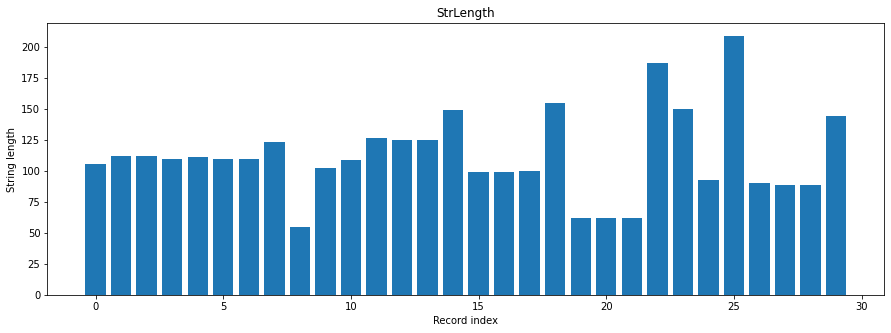

In [ ]:
plt.figure(figsize=(15,5))
plt.bar(range(0,len(data_length),1),data_length)
plt.xlabel("Record index")
plt.ylabel("String length")
plt.title("StrLength")
plt.show()

### Dimension reduction for visualization purposes - MDS

In [ ]:
ed_matrix = np.zeros((len(data),len(data)), dtype=np.int)
for i in range(0,len(data),1):
  for j in range(0,len(data),1):
    ed_matrix[i][j] = editdistance.eval(data[i],data[j])

In [ ]:
from sklearn.manifold import MDS

mds = MDS()
components = mds.fit_transform(ed_matrix)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_mds.py:419: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn("The MDS API has changed. ``fit`` now constructs an"


In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
components = pca.fit_transform(ed_matrix)

In [ ]:
from numpy.linalg import svd

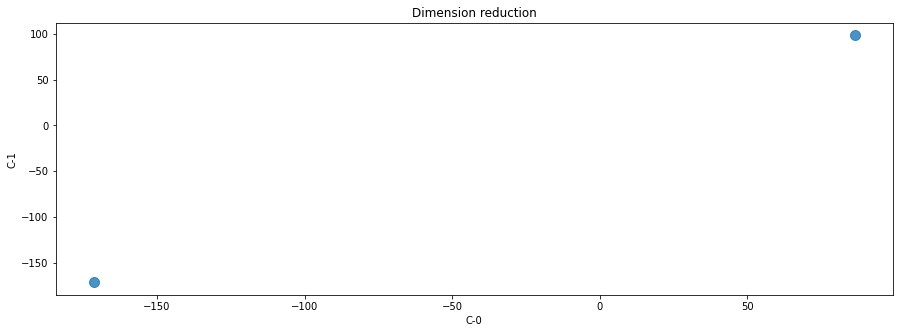

In [ ]:
plt.figure(figsize=(15,5))
plt.plot(components[0],components[1],'o',markersize=10, alpha=0.8)
plt.xlabel("C-0")
plt.ylabel("C-1")
plt.title("Dimension reduction")
# plt.legend(loc='center left', labelspacing=3)
plt.show()

### Evaluation

In [ ]:
%%time
model = RankedWTAHash(
    max_numberOf_clusters= 20,
    max_editDistance= 200,
    windowSize= 3,
    similarityThreshold= 0.8,
    metric='kendal',
    similarityVectors='initial'
)
model = model.fit(data)
evaluate_cora(model.mapping_matrix,true_matrix, True)


#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[ 3 17 21 23 28]

- Final number of prototypes:  5

# Finished in 0.0440 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 3 2 5 4]
 [1 2 2 4 3]
 [1 3 2 4 3]
 [1 3 2 4 3]
 [1 3 2 4 3]
 [1 3 2 4 3]
 [1 3 2 4 3]
 [1 2 3 4 3]
 [4 3 1 5 2]
 [3 2 1 4 2]
 [4 1 3 5 2]
 [4 1 2 5 3]
 [4 1 2 5 3]
 [4 1 2 5 3]
 [2 1 4 5 3]
 [4 1 2 5 3]
 [4 1 2 5 3]
 [4 1 2 5 3]
 [3 2 1 5 4]
 [4 3 1 5 2]
 [4 3 1 5 2]
 [4 3 1 5 2]
 [5 2 1 4 3]
 [3 2 4 1 2]
 [3 2 1 4 1]
 [3 2 4 1 3]
 [4 3 2 5 1]
 [4 3 2 5 1]
 [4 3 2 5 1]
 [1 3 4 5 2]]

# Finished in 0.0646 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 2 0 0 0 0]

- WTA number of buckets:  3

- WTA RankedVectors after permutation:
[[5 3 4]
 [4 2 3]
 [4 3 3]
 [4 3 3]
 [4 3 3]
 [4 3 3]
 [4 3 3]
 [4 2 3]
 [5 3 2]
 [4 2 2]
 [5 1 2]
 [5 1 3]
 [5 1 3]
 [5 1 3]
 [5 1 3]
 [5 1 3]
 [5 1 3]
 [5 1 3]
 [5 2 4]
 [5 3 2]
 [5 3 2]
 [5 3 2]
 [4 2 3]
 [1 2 2]
 [4 2 1]
 [1 2 3]
 [5 3 1]
 [5 3 1]
 [5 3 1]
 [5 3 2]]

# Finished in 0.0657 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 26, 27, 28, 29], 1: [23], 2: [25]}
[[1 3 2 5 4]
 [1 2 2 4 3]
 [1 3 2 4 3]
 [1 3 2 4 3]
 [1 3 2 4 3]
 [1 3 2 4 3]
 [1 3 2 4 3]
 [1 2 3 4 3]
 [4 3 1 5 2]
 [3 2 1 4 2]
 [4 1 3 5 2]
 [4 1 2 5 3]
 [4 1 2 5 3]
 [4 1 2 5 3]
 [2 1 4 5 3]
 [4 1 2 5 3]
 [4 1 


- Similarity mapping in a dictionary
{0: [1, 2, 3, 4, 5, 6], 1: [2, 3, 4, 5, 6, 7], 2: [3, 4, 5, 6], 3: [4, 5, 6], 4: [5, 6], 5: [6], 8: [9, 19, 20, 21, 24], 9: [19, 20, 21, 24], 11: [12, 13, 15, 16, 17], 12: [13, 15, 16, 17], 13: [15, 16, 17], 15: [16, 17], 16: [17], 19: [20, 21, 24], 20: [21, 24], 21: [24], 24: [26, 27, 28], 26: [27, 28], 27: [28]}
- Similarity mapping in a matrix
[[0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 1 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 1 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 1 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 1 

In [ ]:
true_matrix

array([[0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1],
       [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0],
       [1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1],
       [1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1],
       [1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1],
       [1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0]], dtype=int8)

In [ ]:
max_numberOf_clusters= [10,20, 50, 100]
max_editDistance= [200,300]
windowSize= [3, 5, 10, 15]
similarityThreshold= [0.8,0.9]
metric= ['kendal', 'customKendal','jaccard','pearson']
similarityVectors= ['ranked','initial']

results_shuffled = GridSearch_cora(data,true_matrix,max_numberOf_clusters,max_editDistance,similarityThreshold,windowSize,metric,similarityVectors)

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  3
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0556 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0549 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:416: UserWarning: Window size greater than vector dimension



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0507 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0706 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0458 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0364 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0491 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1164 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  3
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0459 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0561 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0474 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0506 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1013 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0496 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0797 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0644 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  3
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0697 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0796 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0364 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1715 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0488 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0518 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0544 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1997 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  3
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0662 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0538 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0570 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0616 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0648 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0634 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0604 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0679 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  5
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1083 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0573 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0582 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0660 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0570 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0752 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0476 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1322 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  5
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0958 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0525 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0871 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0851 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0605 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0810 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0458 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0559 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  5
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0805 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1062 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1096 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1097 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0551 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0851 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1133 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1409 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  5
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0410 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0445 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0490 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0702 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1245 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1430 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1039 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0592 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  10
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0903 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0920 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0980 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1320 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1059 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0568 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0518 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1849 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  10
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0632 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1012 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0887 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0631 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0898 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0922 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0898 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0781 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  10
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0659 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0741 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0823 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1281 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0901 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1014 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1008 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1159 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  10
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0772 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0923 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0582 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1087 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1017 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0914 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1049 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1010 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  15
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0881 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0915 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0852 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1014 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0745 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0745 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0526 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0889 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  15
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0865 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0649 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0938 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0675 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0528 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0708 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0767 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0892 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  15
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0553 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0825 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0888 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1865 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0906 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1076 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0612 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0961 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  15
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0764 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0896 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0640 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1102 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0646 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0753 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0493 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0452 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  3
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0428 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0955 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0507 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1211 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0532 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0412 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0516 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1569 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  3
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0780 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0871 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0800 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0846 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0811 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0971 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0667 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0639 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  3
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0851 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0802 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0490 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1323 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0899 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1003 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0991 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1558 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  3
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1036 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0590 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0953 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0946 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0788 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0934 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0621 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0504 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  5
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0678 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0583 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0657 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1465 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0456 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0579 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0902 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1770 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  5
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1046 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1121 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0960 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1016 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0892 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0924 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0916 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0835 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  5
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0867 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0916 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0403 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1408 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0764 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0604 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0418 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1373 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  5
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0549 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0929 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0798 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0957 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0604 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0721 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0957 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0805 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  10
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0407 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0541 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0711 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0845 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0796 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0746 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0814 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1065 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  10
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0846 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0753 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0646 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0662 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1133 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0913 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0735 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0784 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  10
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0789 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0727 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0529 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1338 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0725 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0427 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0727 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1439 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  10
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0990 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0630 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0746 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0649 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1156 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0889 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0959 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0704 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  15
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0997 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0806 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0853 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1521 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0396 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0425 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1068 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1118 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  15
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0733 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0816 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0711 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0742 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0695 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0694 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0874 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0830 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  15
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0861 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0857 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0728 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1116 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0703 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0850 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0846 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1270 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  15
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0971 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0900 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0899 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0460 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0812 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0480 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0391 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0751 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  3
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0487 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0549 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0758 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1013 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:355: UserWarning: Vector dim equal to 1-Setting metric to kendalltau




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0558 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0838 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0808 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1241 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  3
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0654 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0644 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0854 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1088 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0719 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0696 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0844 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1156 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  3
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0914 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0420 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0834 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0862 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0401 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0619 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0818 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1366 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  3
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0913 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0901 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0882 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1290 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0454 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0680 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0705 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1195 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  5
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0594 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1054 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0818 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1308 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0419 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0439 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0986 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1362 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  5
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0576 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0740 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0885 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1653 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0795 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0978 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0472 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1248 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  5
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0472 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0790 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0838 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.2113 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0772 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0703 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0746 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1109 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  5
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0509 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0466 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0563 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1414 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0681 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0875 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1089 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1139 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  10
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0859 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0989 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0531 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1293 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0406 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0399 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0522 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1958 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  10
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0891 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0773 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0823 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1105 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0834 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0733 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0732 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1218 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  10
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0759 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0777 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0845 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1268 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0900 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0862 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0918 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1440 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  10
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0815 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0812 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0834 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1148 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0871 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1160 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0804 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1218 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  15
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0690 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0643 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0786 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1224 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0812 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0692 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0686 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1181 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  15
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0751 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0875 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0800 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1066 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0809 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0608 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0456 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1325 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  15
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0935 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0810 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0759 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1260 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0840 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0910 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0822 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1081 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  15
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0625 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0719 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0944 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1246 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0481 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0699 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0456 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1497 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  3
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0570 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0525 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0605 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1480 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.1173 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0836 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0666 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1249 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  3
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0757 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0852 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0770 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1157 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0717 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0565 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0923 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1724 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  3
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0535 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0653 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0615 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1497 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0622 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0687 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0606 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1125 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  3
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0639 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1233 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0857 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1306 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0825 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0915 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0893 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1361 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0919 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0738 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0711 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1191 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0549 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0558 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0837 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1385 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0831 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0719 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0807 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1002 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0746 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0571 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0602 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1453 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.1061 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0823 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1138 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1288 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0634 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0607 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1033 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0960 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0834 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0818 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0809 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1252 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0829 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0802 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0800 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1413 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0789 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0833 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0788 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1258 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0868 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0815 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0829 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1183 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0814 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0898 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0917 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1276 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0930 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0863 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0835 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1265 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0763 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0754 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0742 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1152 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0803 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0795 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0717 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1327 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0499 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0455 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.4313 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1910 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.1065 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0990 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1044 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1663 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0414 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0807 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0966 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1218 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0786 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0617 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0760 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1184 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0754 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0756 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0625 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1324 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0794 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0795 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0778 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1110 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0610 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0507 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0553 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1644 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0807 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0737 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0827 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1194 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  10
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0589 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0774 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0531 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1287 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0725 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0681 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0799 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1148 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  3
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0766 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0683 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0627 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0939 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0732 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0833 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0683 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0682 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  3
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0701 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0590 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0804 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1035 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0949 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0887 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0404 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0628 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  3
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0871 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0892 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1000 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1220 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0521 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0939 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0728 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1122 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  3
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0793 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0940 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0920 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1048 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0743 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0809 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0702 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0801 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  5
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0643 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0734 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0680 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0978 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1161 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1048 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0630 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0992 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  5
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0609 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0560 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0950 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0915 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0490 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0390 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0990 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0738 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  5
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0606 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0630 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0957 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1273 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0798 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0631 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0613 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1298 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  5
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0944 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1051 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0978 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1286 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0911 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0868 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0666 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1037 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  10
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0800 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1037 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0359 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0728 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0663 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0983 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0819 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0971 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  10
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0440 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0554 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0487 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1546 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0450 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0429 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0569 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1184 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  10
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0674 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0848 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0811 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1447 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0656 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0410 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0729 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1805 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  10
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0611 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0898 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1013 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0583 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0603 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0835 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0789 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0678 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  15
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0782 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0807 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0718 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0985 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0712 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0730 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0782 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0898 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  15
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0801 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0794 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0567 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0738 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0847 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0593 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0856 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0931 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  15
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0765 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0913 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1531 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1564 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0493 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0626 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1039 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1728 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  15
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0787 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0820 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0917 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0946 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0893 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0521 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0952 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0479 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  3
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0549 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0877 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0952 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1188 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0833 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0805 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0808 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1029 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  3
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0547 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0583 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0606 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0862 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0439 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0456 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1046 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0985 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  3
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0830 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0887 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0970 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1174 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0761 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0880 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0831 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1395 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  3
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1228 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0893 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0991 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0964 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0738 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0863 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0776 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0873 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  5
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0844 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0844 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0941 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1067 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0892 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0867 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0913 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1186 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  5
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0802 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0513 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0719 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0565 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0559 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1074 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0553 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0527 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  5
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0479 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0675 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0946 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1570 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0771 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0693 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0429 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1201 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  5
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0385 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0961 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0897 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0852 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0818 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0877 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0857 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0866 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  10
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1140 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0585 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0859 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1095 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0833 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0808 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0789 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0979 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  10
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0721 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0904 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0738 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0755 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0862 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0843 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0823 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0847 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  10
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0632 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0764 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0848 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1167 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0909 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0484 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0480 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1258 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  10
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0573 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0921 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0935 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0838 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0589 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1055 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1244 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0609 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  15
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1169 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0661 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0797 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0843 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0755 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0813 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0902 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1082 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  15
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0807 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1243 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0783 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0392 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0769 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0540 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0635 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1021 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  15
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0937 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0988 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0532 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1107 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0418 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0503 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0417 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1789 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  15
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0676 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0904 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1125 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0786 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0790 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0839 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0932 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0401 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  3
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0470 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0646 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0603 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1692 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0729 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0744 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0748 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1005 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  3
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0737 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0816 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0725 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1058 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0663 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0912 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0725 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1152 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  3
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0785 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0867 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0869 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1313 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0782 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1046 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0672 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1035 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  3
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0898 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0700 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0814 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1466 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0693 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0754 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0762 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1169 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  5
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0705 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0766 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0703 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1021 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0726 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0851 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0755 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1046 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  5
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0733 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0413 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0684 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1387 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0677 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0420 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0431 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1837 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  5
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0795 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0794 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0836 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1357 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0537 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0774 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0796 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1057 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  5
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0672 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0963 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0563 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1185 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0695 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0945 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0711 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1074 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  10
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0611 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0640 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0665 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1154 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0698 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0723 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0745 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1266 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  10
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0677 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0884 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0768 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1114 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0814 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0849 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0872 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1142 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  10
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0849 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0880 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0825 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1134 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0689 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0785 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0708 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1120 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  10
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0834 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0787 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0798 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1160 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0908 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0849 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0763 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1119 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  15
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0436 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1051 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0725 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1125 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0844 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0833 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1043 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1023 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  15
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0746 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0741 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0480 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0932 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0739 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1389 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1246 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1551 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  15
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0547 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0966 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0971 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1657 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0554 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0664 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0645 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1319 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  15
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0462 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0678 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1100 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1121 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0952 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0775 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1144 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1371 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  3
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.1037 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0803 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0885 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1276 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0501 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0953 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0865 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1852 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  3
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0798 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0838 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1130 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1253 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0729 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0679 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0801 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1111 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  3
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0761 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1033 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0710 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1076 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0779 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0586 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0690 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1244 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  3
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0597 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0476 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0773 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1728 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0815 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0846 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0840 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1348 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0884 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0901 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1002 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1040 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0873 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0873 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0743 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1204 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0847 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1041 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0838 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1290 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0913 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0841 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0830 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1176 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0805 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0818 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0944 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1327 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0698 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0970 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0667 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1515 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0855 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0846 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0866 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1356 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0781 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0838 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0924 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1255 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0836 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0363 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0562 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1592 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0575 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0571 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0571 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1716 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0623 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0373 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0379 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1288 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0933 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1127 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0966 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1436 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0543 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0543 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0537 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1707 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0805 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1047 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0865 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1206 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.1032 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0941 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0901 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1365 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0969 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0584 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0729 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1571 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0832 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0445 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1115 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1512 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0648 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0561 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1304 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1164 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0777 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0617 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0870 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1578 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0668 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0844 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0817 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1472 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.1150 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0688 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0552 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1293 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0775 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0937 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0588 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1539 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  20
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0538 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0870 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0968 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0978 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0796 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0825 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0829 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1133 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  3
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0861 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0796 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0408 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1211 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0772 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0860 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0862 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1197 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  3
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0430 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0815 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0912 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1094 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0443 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0981 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1006 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0970 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  3
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0945 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1072 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0903 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1357 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0940 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0901 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0922 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1406 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  3
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0816 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0882 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0866 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0888 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0879 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0920 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0969 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1017 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  5
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0866 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0842 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0856 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1371 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0894 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0789 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0826 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0878 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  5
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0759 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0482 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0897 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1251 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0432 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0402 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0666 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1049 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  5
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1109 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1102 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0929 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1492 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1098 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0950 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0779 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1164 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  5
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0834 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0862 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0696 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0901 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0744 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0530 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0985 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1085 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  10
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1024 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1119 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0713 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0969 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0795 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0790 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0793 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1341 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  10
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0566 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0919 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0903 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1111 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0829 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0972 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0595 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0630 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  10
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0671 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0647 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0806 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1533 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0850 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.6673 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0900 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1795 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  10
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0389 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0394 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0874 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0409 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0921 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0825 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1242 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0873 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  15
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0920 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0976 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0958 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0788 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0985 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0960 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1001 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1372 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  15
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0516 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0965 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0954 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1060 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0725 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0601 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0538 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1081 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  15
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0874 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0835 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0618 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1356 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0897 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0814 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1180 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1286 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  15
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0870 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0721 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1016 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0973 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0803 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0756 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0856 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0755 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  3
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1014 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0962 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0846 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1230 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0907 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0947 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0844 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1051 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  3
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0768 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0784 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0788 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0741 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0710 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0763 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0842 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0856 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  3
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0774 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0770 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1032 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1199 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0791 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0761 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0760 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1339 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  3
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0852 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0748 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0880 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0832 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0706 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0705 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0817 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0744 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  5
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1094 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0736 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0669 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1036 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0447 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0864 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0869 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1080 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  5
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0520 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0339 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0528 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0759 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0847 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0945 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0531 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0734 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  5
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0829 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0898 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0826 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1769 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0882 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0890 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0984 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1298 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  5
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0488 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0951 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0584 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1052 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1003 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1087 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0881 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0854 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  10
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1029 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0713 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0468 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1704 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0891 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0814 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1152 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0858 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  10
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0498 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0444 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0883 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0969 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.1080 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1044 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0445 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0610 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  10
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0805 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0809 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0778 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1284 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0660 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0949 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0808 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1569 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  10
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0778 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0788 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0772 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0891 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0930 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0968 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0941 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0813 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  15
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0920 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0799 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0783 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0955 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0807 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0943 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0871 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1331 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  15
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0751 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0796 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0821 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0792 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation  



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0724 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0591 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0555 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0621 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#############################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  15
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0848 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0849 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0776 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1621 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0778 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0922 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0724 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1017 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  200
similarityThreshold:  0.9
windowSize:  15
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0649 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0922 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0747 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0697 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0823 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0750 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0417 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.0966 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  3
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0730 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0787 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0610 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1001 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0748 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0712 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0832 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1238 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  3
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0541 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0489 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0937 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1774 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0563 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0705 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0826 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0981 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  3
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0983 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0692 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0893 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1016 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0910 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0799 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0963 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1360 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  3
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0663 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0911 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0893 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1161 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.1134 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0651 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0848 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1311 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  5
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.1193 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0841 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0689 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1388 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0946 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1067 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0754 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1435 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  5
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0883 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0887 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0831 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1374 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0885 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0922 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0915 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1309 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  5
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0681 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0754 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0969 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1369 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0899 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0922 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0923 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1191 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  5
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0835 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0822 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0904 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1164 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0792 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1467 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0656 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1651 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  10
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0935 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0935 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0728 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1599 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0868 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0836 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0829 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1372 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  10
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0831 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0655 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0838 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1161 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0718 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0791 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1010 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1079 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  10
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0460 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0546 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0555 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0879 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0470 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0849 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1031 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1755 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  10
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0904 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0846 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0848 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1443 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0952 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0776 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0690 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1202 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  15
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0734 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0739 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0685 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1098 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0732 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1258 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0921 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1603 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  15
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0767 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0814 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0880 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1291 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0841 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0847 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0617 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1289 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  15
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0956 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0888 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0893 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1142 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0558 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0791 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0872 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1478 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.8
windowSize:  15
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0890 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0797 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0879 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1158 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0818 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0797 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0589 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1478 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  3
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0699 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1018 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0890 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1747 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0941 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0909 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0932 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1838 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  3
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0892 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1014 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0919 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1150 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0940 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0968 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1538 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1027 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  3
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0712 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0981 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0965 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1623 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0943 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1025 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1100 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1413 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  3
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0713 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0911 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0850 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1109 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.1015 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1141 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1004 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1365 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0484 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0980 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0946 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1589 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0438 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0444 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1124 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1161 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0867 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1178 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0772 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1154 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0792 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0917 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0930 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1219 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0977 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0792 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0678 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1200 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0821 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1041 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0783 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1789 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0766 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0878 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0957 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1244 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0728 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1109 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0585 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0964 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0908 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0873 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0870 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1575 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0682 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0730 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0693 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1144 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0798 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0783 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0767 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1268 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0556 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0365 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0505 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1964 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0656 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1202 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1016 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1170 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0700 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0549 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1125 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1538 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0831 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0677 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0445 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1281 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0711 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1002 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1132 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1340 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0907 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0988 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0798 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1405 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0609 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0718 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0990 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1570 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0967 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0944 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1270 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1264 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0736 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0589 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0524 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1289 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.1024 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0873 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0475 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1245 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0523 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0545 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0974 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1807 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.1034 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0938 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0879 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1503 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0856 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1172 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1027 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1097 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  100
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  3
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0869 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1066 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1006 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1184 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0792 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0932 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1248 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1130 secs

#####################################################################
#                    .~ End of training ~.                          #
################

-------------------------
max_numberOf_clusters:  100
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  3
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0784 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0914 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.0874 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]


-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  3
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0892 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1014 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0919 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1150 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0940 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0968 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1538 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1027 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  3
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0712 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0981 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0965 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1623 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0943 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1025 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1100 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1413 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  3
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0713 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0911 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0850 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1109 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.1015 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1141 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1004 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1365 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0484 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0980 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0946 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1589 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0438 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0444 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1124 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1161 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0867 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1178 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0772 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1154 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0792 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0917 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0930 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1219 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0977 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0792 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0678 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1200 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0821 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1041 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0783 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1789 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  5
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0766 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0878 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0957 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1244 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0728 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1109 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0585 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.0964 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0908 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0873 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0870 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1575 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0682 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0730 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0693 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1144 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0798 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0783 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0767 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1268 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0556 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0365 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0505 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1964 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0656 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1202 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1016 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1170 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0700 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0549 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1125 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1538 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  10
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0831 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0677 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0445 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1281 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0711 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1002 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1132 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1340 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0907 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0988 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0798 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1405 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0609 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0718 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0990 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1570 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  customKendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0967 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0944 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1270 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1264 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0736 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0589 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0524 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1289 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  jaccard
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.1024 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0873 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0475 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1245 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0523 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0545 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0974 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1807 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  50
max_editDistancez:  300
similarityThreshold:  0.9
windowSize:  15
metric:  pearson
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.1034 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0938 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.0879 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1503 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################



- Prototypes selected
[12]

- Final number of prototypes:  1

# Finished in 0.0856 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1172 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

- WTA number of buckets:  1

- WTA RankedVectors after permutation:
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]

# Finished in 0.1027 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]}
[[1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]
 [1]]



- Similarity mapping in a dictionary
{}
- Similarity mapping in a matrix
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]]

# Finished in 0.1097 secs

#####################################################################
#                    .~ End of training ~.                          #
#####################################################################

#####################################################################
#                          Evaluation                               #
###################################################

-------------------------
max_numberOf_clusters:  100
max_editDistancez:  200
similarityThreshold:  0.8
windowSize:  3
metric:  kendal
similarityVectors:  ranked
-------------------------

#####################################################################
#     .~ RankedWTAHash with Vantage embeddings starts training ~.   #
#####################################################################

###########################################################
# > 1. Prototype selection phase                          #
###########################################################


-> Finding prototypes and representatives of each cluster:




- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0869 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1066 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[0 0 1 1 0 1 1 1 1 1 0 0 1 0 1]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]

# Finished in 0.1006 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{0: [0, 1, 4, 10, 11, 13], 1: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [1 2]]



- Similarity mapping in a dictionary
{0: [1, 4, 10, 11, 13], 1: [4, 10, 11, 13], 4: [10, 11, 13], 10: [11, 13], 11: [13], 2: [3, 5, 6, 7, 8, 9, 12, 14], 3: [5, 6, 7, 8, 9, 12, 14], 5: [6, 7, 8, 9, 12, 14], 6: [7, 8, 9, 12, 14], 7: [8, 9, 12, 14], 8: [9, 12, 14], 9: [12, 14], 12: [14]}
- Similarity mapping in a matrix
[[0 1 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [1 0 0 0 1 0 0 0 0 0 1 1 0 1 0]
 [0 0 0 1 0 1 1 1 1 1 0 0 1 0 1]
 [0 0 1 0 0 1 1 1 1 1 0 0 1 0 1]
 [1 1 0 0 0 0 0 0 0 0 1 1 0 1 0]
 [0 0 1 1 0 0 1 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 0 1 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 0 1 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 0 1 0 0 1 0 1]
 [0 0 1 1 0 1 1 1 1 0 0 0 1 0 1]
 [1 1 0 0 1 0 0 0 0 0 0 1 0 1 0]
 [1 1 0 0 1 0 0 0 0 0 1 0 0 1 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 0 0 1]
 [1 1 0 0 1 0 0 0 0 0 1 1 0 0 0]
 [0 0 1 1 0 1 1 1 1 1 0 0 1 0 0]]

# Finished in 0.1184 secs

#####################################################################
#                    .~ End of training ~.                          #
################



- Prototypes selected
[0 9]

- Final number of prototypes:  2

# Finished in 0.0792 secs


###########################################################
# > 2. Embeddings based on the Vantage objects            #
###########################################################


-> Creating Embeddings:



- Embeddings created
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.0932 secs


###########################################################
# > 3. WTA Hashing                                        #
###########################################################


-> Creating WTA Buckets:



- WTA Buckets created
[1 1 0 0 1 0 0 0 0 0 1 1 0 1 0]

- WTA number of buckets:  2

- WTA RankedVectors after permutation:
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]

# Finished in 0.1248 secs


###########################################################
# > 4. Similarity checking                                #
###########################################################


-> Similarity checking:
{1: [0, 1, 4, 10, 11, 13], 0: [2, 3, 5, 6, 7, 8, 9, 12, 14]}
[[1 2]
 [1 2]
 [2 1]
 [2 1]
 [1 2]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [2 1]
 [1 2]
 [1 2]
 [2 1]
 [1 2]
 [2 1]]


In [ ]:
results_shuffled

,max_numberOf_clusters,max_editDistance,similarityThreshold,windowSize,metric,similarityVectors,Accuracy,Precision,Recall,F1,Time
1,10,200,0.8,3,kendal,ranked,0.000000,60.784314,100.000000,75.609756,0.238392
2,10,200,0.8,3,kendal,initial,0.000000,60.784314,100.000000,75.609756,0.248626
3,10,200,0.8,3,customKendal,ranked,6.666667,20.000000,9.677419,13.043478,0.200744
4,10,200,0.8,3,customKendal,initial,20.000000,77.777778,90.322581,83.582090,0.296701
5,10,200,0.8,3,jaccard,ranked,0.000000,60.784314,100.000000,75.609756,0.358480
...,...,...,...,...,...,...,...,...,...,...,...
508,100,300,0.9,15,customKendal,initial,26.666667,0.000000,0.000000,0.000000,0.349082
509,100,300,0.9,15,jaccard,ranked,26.666667,0.000000,0.000000,0.000000,0.348588
510,100,300,0.9,15,jaccard,initial,26.666667,0.000000,0.000000,0.000000,0.354726
511,100,300,0.9,15,pearson,ranked,26.666667,0.000000,0.000000,0.000000,0.383596


---

# References

1.   [The dissimilarity representation for pattern recognition, a tutorial
Robert P.W. Duin and Elzbieta Pekalska Delft University of Technology, The Netherlands School of Computer Science, University of Manchester, United Kingdom](http://homepage.tudelft.nl/a9p19/presentations/DisRep_Tutorial_doc.pdf)